# **Library**

In [1]:
import os
import cv2
import pathlib
import numpy as np
import pandas as pd
import splitfolders
import random
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance, ImageOps

# **Data**

In [2]:
# Dataset
train_dir = pathlib.Path('train')
test_dir =  pathlib.Path('test')

### **Train**

In [3]:
# Mencari file gambar
image_extensions = [".jpg", ".JPG", ".jpeg", ".png"]
image_paths = []
for ext in image_extensions:
    image_paths.extend(list(train_dir.rglob(f"*{ext}")))

# Melabeli gambar
labels = [str(fp.parent.name) for fp in image_paths]

# DataFrame
image_paths = pd.Series(image_paths, name="Filepath")
labels = pd.Series(labels, name="Labels")
train_df = pd.DataFrame({"Filepath": image_paths, "Labels": labels})

# Menghitung distribusi gambar
labels_distributionTotal = train_df["Labels"].value_counts()
print(labels_distributionTotal)

Labels
tablet_kapsul      816
botol_obat         802
baterai            800
kertas             800
termometer         800
pet                800
kaleng             800
bohlam             800
daun               796
sisa_makanan       794
kantong_plastik    784
tissue             775
kaca               768
kardus             762
hdpem              720
bungkus_makanan    640
botol_aerosol      421
cangkang_telur     400
Name: count, dtype: int64


Penjelasan singkat:

memuat dan mengorganisir data gambar beserta labelnya ke dalam DataFrame, kemudian menghitung distribusi jumlah gambar per label.

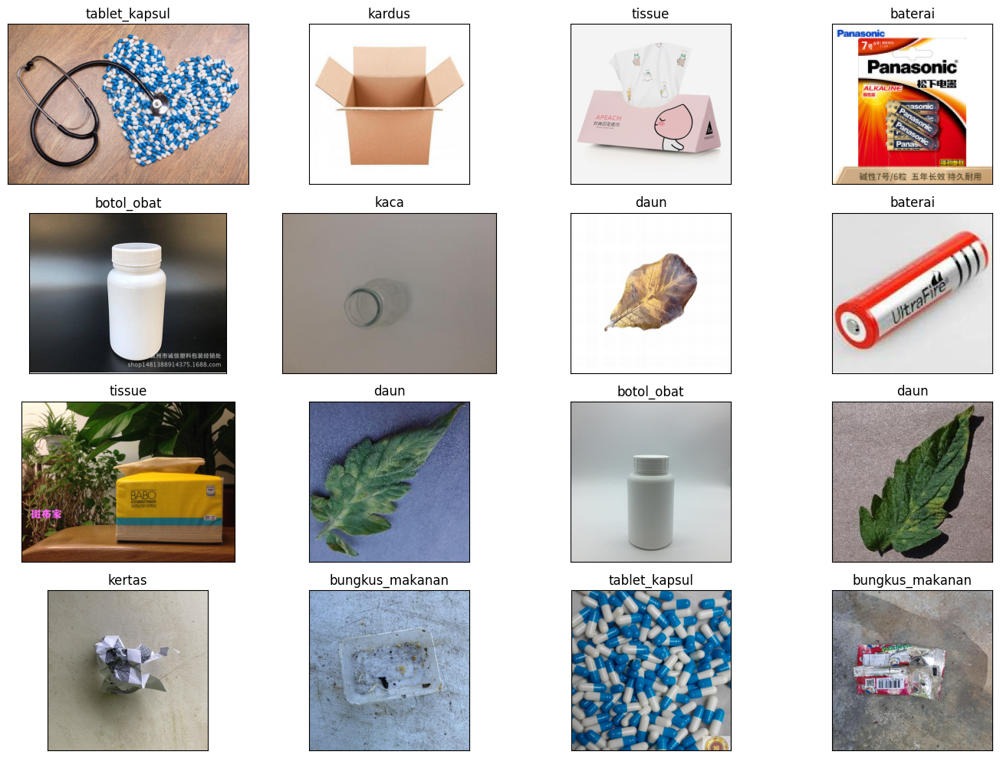

In [4]:
# Acak indeks gambar
random_indeks = np.random.randint(0, len(train_df), 24)

# Membuat gambar dan subplot
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(14, 10))

# Iterasi subplot, tampilkan gambar dan labelnya
for row in range(4):
    for col in range(4):
        index = row * 4 + col
        img_path = train_df.Filepath[random_indeks[index]]
        label = train_df.Labels[random_indeks[index]]
        
        # Baca gambar dan menampilkannya
        img = plt.imread(img_path)
        axes[row, col].imshow(img)
        axes[row, col].set_title(label)
        
        # Hapus ticks pada sumbu x dan y
        axes[row, col].set_xticks([])
        axes[row, col].set_yticks([])

plt.tight_layout()
plt.show()

Penjelasan singkat: 

Menampilkan sampel acak dari gambar dalam dataset beserta labelnya dalam bentuk grid. Tujuannya adalah untuk memvisualisasikan dan memeriksa variasi data serta memastikan bahwa gambar dan labelnya sesuai

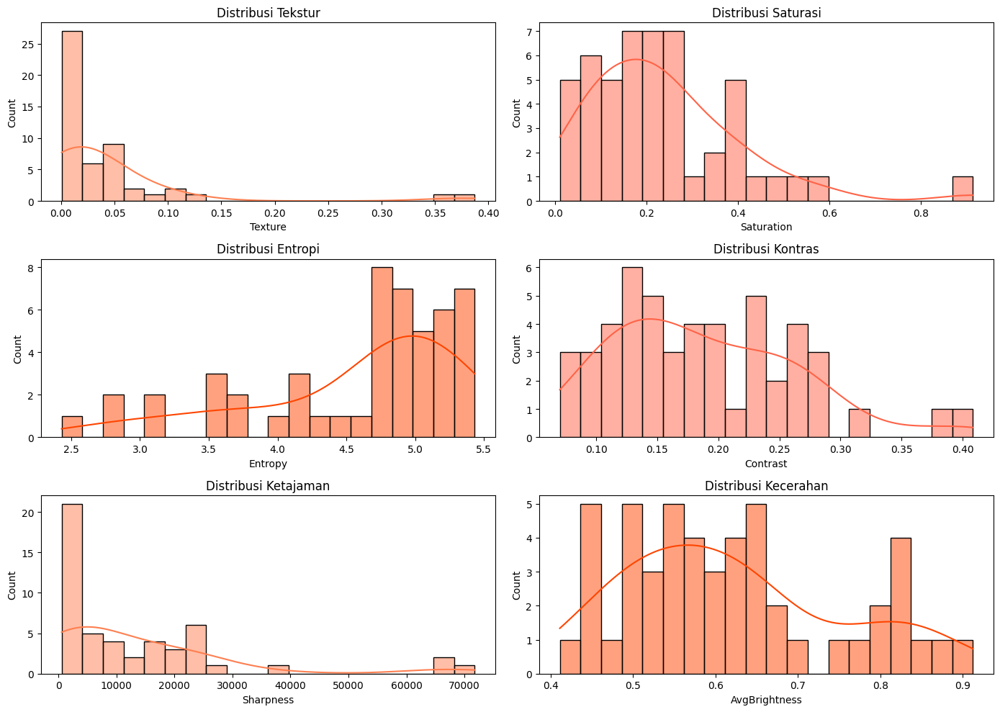

In [6]:
from skimage import io, color, filters
from skimage.filters import sobel
from skimage.exposure import histogram
import scipy.stats as stats
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Pilih subset acak dari gambar
subset_count = 50
chosen_indices = np.random.choice(train_df.index, subset_count, replace=False)

# Hitung metrik kualitas gambar
def calculate_image_quality_metrics(img_path):
    try:
        img = io.imread(img_path)
        if len(img.shape) == 3:
            img_gray = color.rgb2gray(img)
            img_hsv = color.rgb2hsv(img)
            img_saturation = np.mean(img_hsv[:, :, 1])  # Saturasi
        else:
            img_gray = img
            img_saturation = 0

        img_texture = np.var(filters.laplace(img_gray))
        avg_brightness = np.mean(img_gray)
        hist, _ = histogram(img_gray)
        img_entropy = stats.entropy(hist)
        img_contrast = np.std(img_gray)
        img_sharpness = np.sum(np.abs(sobel(img_gray)))

        return avg_brightness, img_contrast, img_sharpness, img_entropy, img_saturation, img_texture
    except ValueError:
        print(f"Error processing image: {img_path}")
        return None, None, None, None, None, None

quality_metrics = {'Path': [], 'AvgBrightness': [], 'Contrast': [], 'Sharpness': [], 'Entropy': [], 'Saturation': [], 'Texture': []}

# Hitung metrik kualitas subset gambar
for index in chosen_indices:
    img_path = train_df.Filepath[index]
    brightness, contrast, sharpness, entropy, saturation, texture = calculate_image_quality_metrics(img_path)

    if brightness is not None:
        quality_metrics['Path'].append(img_path)
        quality_metrics['AvgBrightness'].append(brightness)
        quality_metrics['Contrast'].append(contrast)
        quality_metrics['Sharpness'].append(sharpness)
        quality_metrics['Entropy'].append(entropy)
        quality_metrics['Saturation'].append(saturation)
        quality_metrics['Texture'].append(texture)

metrics_df = pd.DataFrame(quality_metrics)

# Histogram
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))
sns.histplot(metrics_df['Texture'], bins=20, kde=True, ax=axes[0, 0], color='coral')
axes[0, 0].set_title('Distribusi Tekstur')
sns.histplot(metrics_df['Saturation'], bins=20, kde=True, ax=axes[0, 1], color='tomato')
axes[0, 1].set_title('Distribusi Saturasi')
sns.histplot(metrics_df['Entropy'], bins=20, kde=True, ax=axes[1, 0], color='orangered')
axes[1, 0].set_title('Distribusi Entropi')
sns.histplot(metrics_df['Contrast'], bins=20, kde=True, ax=axes[1, 1], color='tomato')
axes[1, 1].set_title('Distribusi Kontras')
sns.histplot(metrics_df['Sharpness'], bins=20, kde=True, ax=axes[2, 0], color='coral')
axes[2, 0].set_title('Distribusi Ketajaman')
sns.histplot(metrics_df['AvgBrightness'], bins=20, kde=True, ax=axes[2, 1], color='orangered')
axes[2, 1].set_title('Distribusi Kecerahan')
plt.tight_layout()
plt.show()

Penjelasan singkat:

Distribusi tekstur, saturasi entropy, kontras, ketajaman, kecerahan tidak menyebar secara merata
Kode ini digunakan untuk menghitung dan memvisualisasikan metrik kualitas gambar dari subset acak gambar dalam dataset. Tujuannya adalah untuk mengevaluasi dan menganalisis kualitas gambar berdasarkan beberapa metrik seperti kecerahan, kontras, ketajaman, entropi, saturasi, dan tekstur. Ini membantu dalam memahami karakteristik dan kualitas keseluruhan dataset.

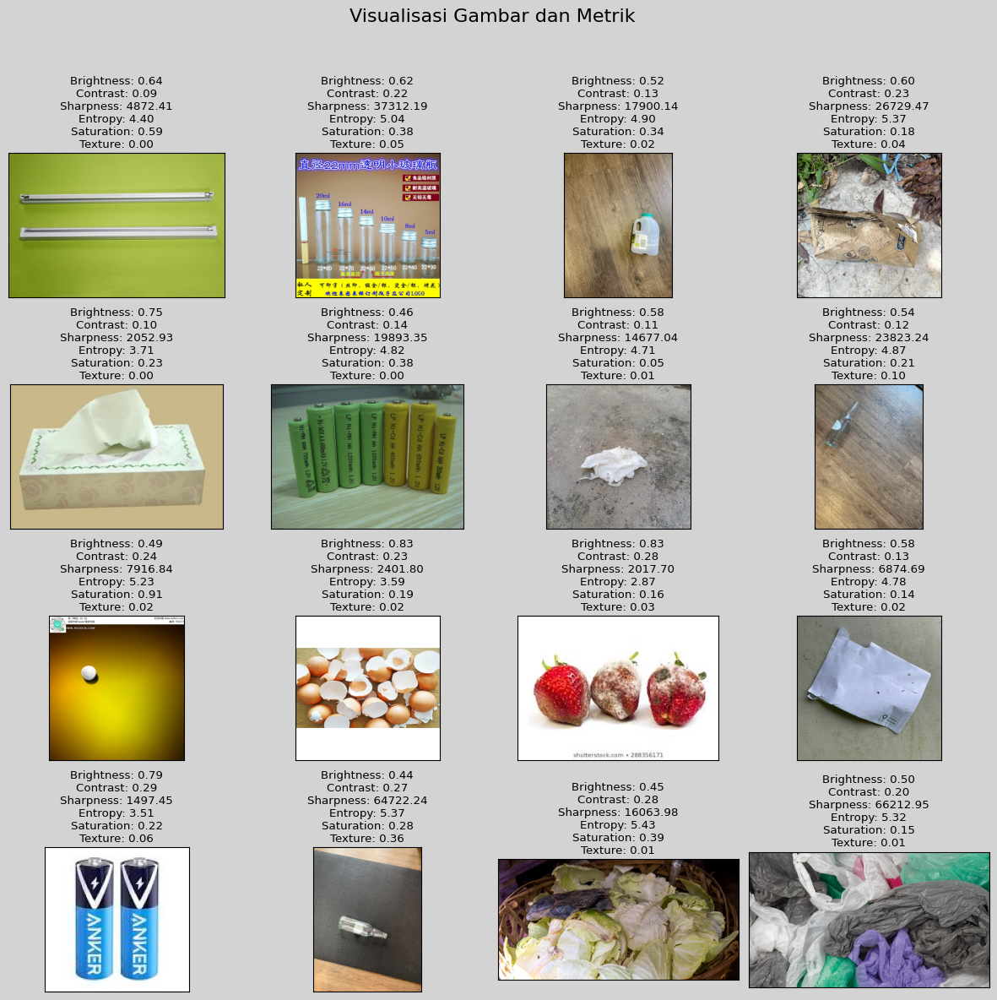

In [7]:
import matplotlib.pyplot as plt
from skimage import io


# Mengatur konfigurasi 
plt.rc('font', size=8)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 12), subplot_kw={'xticks': [], 'yticks': []})
plt.subplots_adjust(wspace=0.3, hspace=0.3)  #jarak
fig.suptitle('Visualisasi Gambar dan Metrik', fontsize=16)
fig.patch.set_facecolor('lightgray')

for i, ax in enumerate(axes.flat):
    if i >= len(chosen_indices):
        ax.axis('off')
        continue

    index = chosen_indices[i]
    img = io.imread(train_df.Filepath[index])
    q_index = metrics_df.index[metrics_df['Path'] == train_df.Filepath[index]][0]
    ax.imshow(img)
    ax.set_title(f"Brightness: {metrics_df.iloc[q_index]['AvgBrightness']:.2f}\nContrast: {metrics_df.iloc[q_index]['Contrast']:.2f}\nSharpness: {metrics_df.iloc[q_index]['Sharpness']:.2f}\nEntropy: {metrics_df.iloc[q_index]['Entropy']:.2f}\nSaturation: {metrics_df.iloc[q_index]['Saturation']:.2f}\nTexture: {metrics_df.iloc[q_index]['Texture']:.2f}", wrap=True)

plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()

 Penjelasan singkat:
 
 Kode ini digunakan untuk menampilkan sampel gambar dari dataset dalam grid, bersama dengan metrik kualitas gambar seperti kecerahan, kontras, ketajaman, entropi, saturasi, dan tekstur. Tujuannya adalah untuk memvisualisasikan gambar sekaligus melihat metrik kualitasnya secara langsung

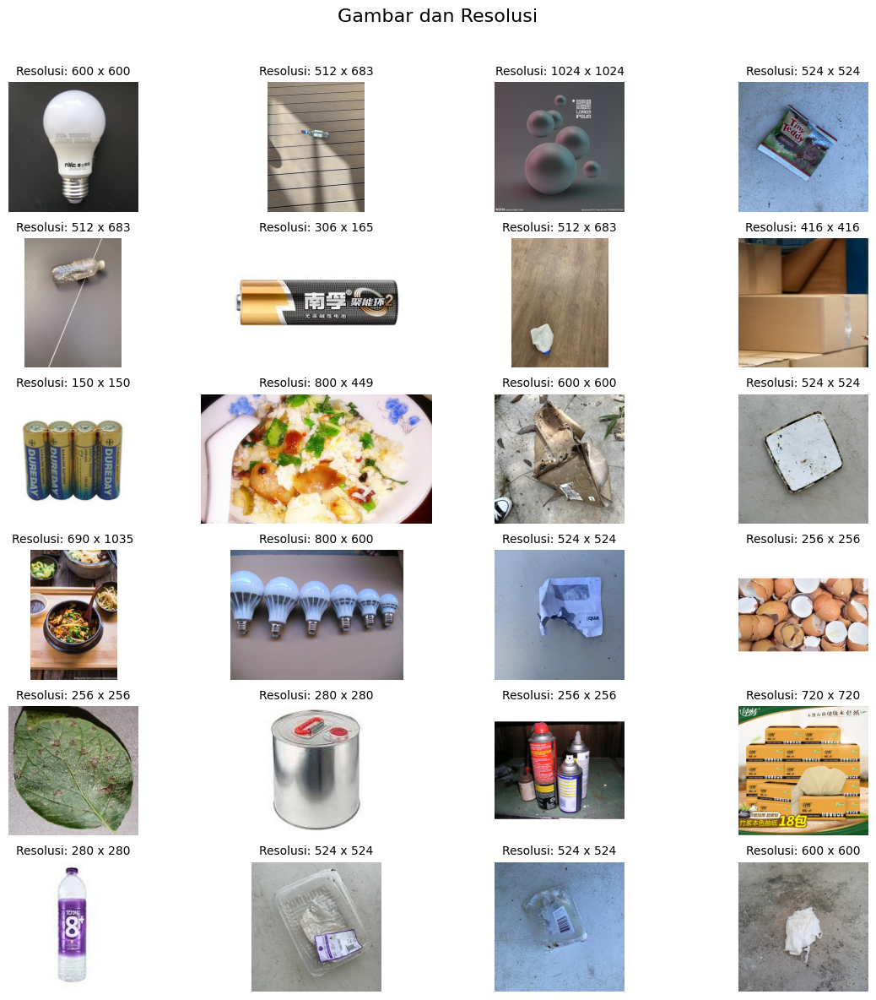

In [8]:
import math

def show_images_resolutions(train_df, num_images=24):
    selected_images = train_df.sample(num_images) #gambar dipilih acak
 
    num_cols = 4
    num_rows = math.ceil(num_images / num_cols)

    # tata letak
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 12))
    fig.suptitle('Gambar dan Resolusi', fontsize=16)

    # Iterasi gambar, tampilkan
    for i, (index, row) in enumerate(selected_images.iterrows()):
        ax = axes.flatten()[i]
        image_path = row['Filepath']
        with Image.open(image_path) as img:
            ax.imshow(img)
            ax.set_title(f"Resolusi: {img.width} x {img.height}", fontsize=10)
            ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

show_images_resolutions(train_df, num_images=24)

Penjelasan singkat:

Kode ini digunakan untuk menampilkan sampel gambar dari dataset beserta resolusi masing-masing gambar. Tujuannya adalah untuk memvisualisasikan gambar dan mengetahui resolusinya secara langsung, sehingga membantu dalam evaluasi dan analisis kualitas teknis gambar dalam dataset

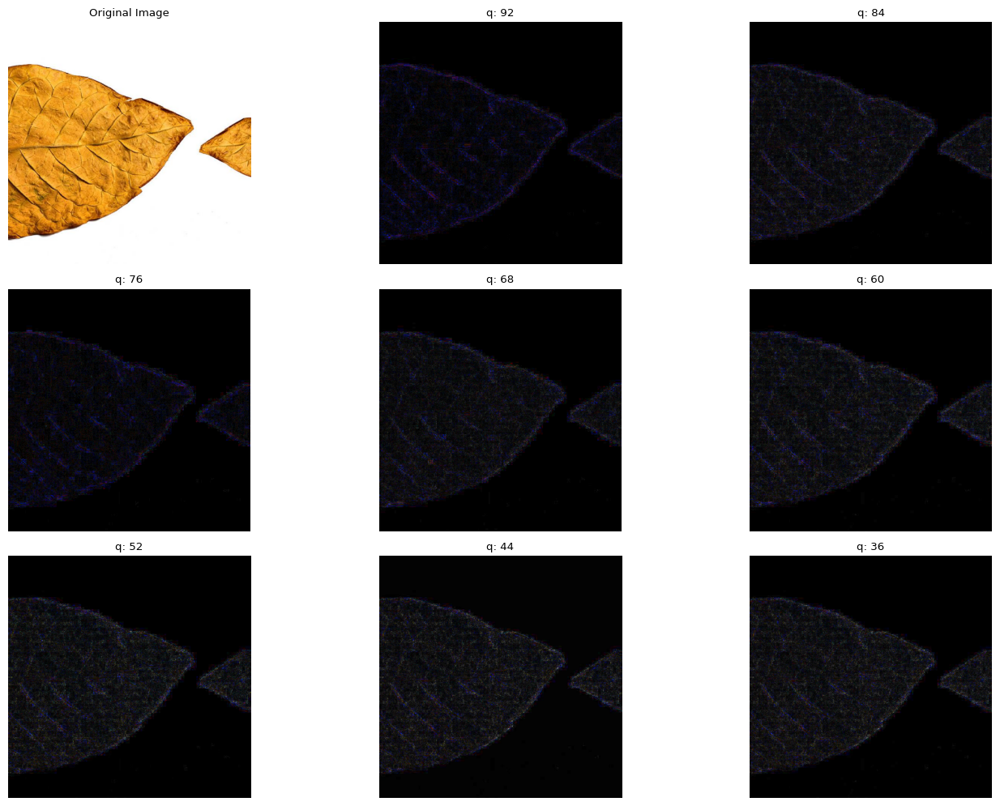

In [9]:
import os
import random
from PIL import Image, ImageChops, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

def get_random_image(dir_path):
    return os.path.join(dir_path, random.choice([f for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f))]))

def compute_ela(img_path, quality=90):
    temp_file = 'temp_img1.jpeg'
    img = Image.open(img_path)
    img.save(temp_file, 'JPEG', quality=quality)
    comp_img = Image.open(temp_file)
    ela_diff = ImageChops.difference(img, comp_img).convert('L')
    os.remove(temp_file)  # Menghapus file sementara
    return np.array(ela_diff) * 15

def create_ela_image(img_path, quality=90):
    temp_file = 'temp_img1.jpeg'
    img = Image.open(img_path).convert('RGB')
    img.save(temp_file, 'JPEG', quality=quality)
    comp_img = Image.open(temp_file)
    ela_img = ImageChops.difference(img, comp_img)
    os.remove(temp_file)  # Menghapus file sementara
    scale = 255.0 / (max(max(ex[1] for ex in ela_img.getextrema()), 1) + 1)  # Menambahkan 1 untuk menghindari pembagian dengan 0
    return ImageEnhance.Brightness(ela_img).enhance(scale)

# Visualisasi
dir_path = 'train/daun'
img_path = get_random_image(dir_path)
orig_img = Image.open(img_path).convert('RGB')
qualities = [100 - i * 8 for i in range(9)]

fig, axes = plt.subplots(3, 3, figsize=(15, 10))
for ax, q in zip(axes.flat, qualities):
    if q == 100:
        ax.imshow(orig_img)
        ax.set_title('Original Image')
    else:
        ela_img = create_ela_image(img_path, q)
        ax.imshow(ela_img, cmap='gray')
        ax.set_title(f'q: {q}')
    ax.axis('off')
plt.tight_layout()
plt.show()

Penjelasan singkat:

Kode ini digunakan untuk menampilkan perbedaan tingkat kompresi gambar menggunakan metode Error Level Analysis (ELA). Tujuannya adalah untuk mendeteksi perubahan atau manipulasi pada gambar dengan membandingkan gambar asli dengan gambar yang disimpan kembali pada berbagai tingkat kualitas kompresi JPEG. ELA membantu dalam analisis forensik gambar untuk melihat artefak kompresi yang bisa mengindikasikan adanya manipulasi pada gambar

## **Test**

In [10]:
import re
from functools import cmp_to_key

# Eekstrak angka dari nama file
def extract_number(filepath):
   match = re.search(r'\d+', filepath.stem)
   return int(match.group()) if match else float('inf')

# Bandingkan dua file berdasarkan angka
def custom_sort(a, b):
   a_num = extract_number(a)
   b_num = extract_number(b)
   if a_num == b_num:
       return 0
   elif a_num < b_num:
       return -1
   else:
       return 1

# Urutkan jalur file secara numerik
def sort_numerically(filepaths):
   return sorted(filepaths, key=cmp_to_key(custom_sort))

# Muat gambar dan urutkan
def load_test_images(test_dir):
   filepaths_test = [filepath for filepath in test_dir.glob('*') if filepath.is_file()]
   filepaths_test = sort_numerically(filepaths_test)
   filepaths_test = [str(filepath) for filepath in filepaths_test]
   return filepaths_test

filepaths_test = load_test_images(test_dir)
test_df = pd.DataFrame(filepaths_test, columns=['Filepath'])
print(test_df)

                Filepath
0        test\test_1.jpg
1        test\test_2.JPG
2        test\test_3.png
3        test\test_4.jpg
4        test\test_5.JPG
...                  ...
1764  test\test_1765.jpg
1765  test\test_1766.jpg
1766  test\test_1767.JPG
1767  test\test_1768.jpg
1768  test\test_1769.JPG

[1769 rows x 1 columns]


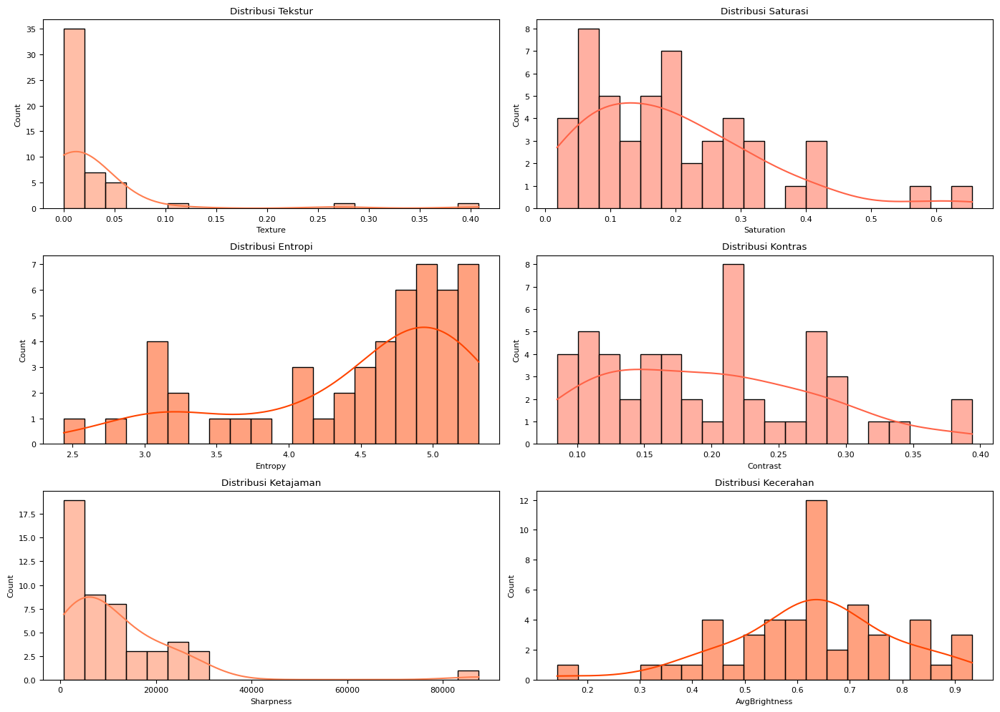

In [11]:
from skimage import io, color, filters
from skimage.filters import sobel
from skimage.exposure import histogram
import scipy.stats as stats
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Pilih subset acak dari gambar
subset_count = 50
chosen_indices = np.random.choice(test_df.index, subset_count, replace=False)

# Hitung metrik kualitas gambar
def calculate_image_quality_metrics(img_path):
    img = io.imread(img_path)
    if len(img.shape) == 3:
        img_gray = color.rgb2gray(img)
        img_hsv = color.rgb2hsv(img)
        img_saturation = np.mean(img_hsv[:, :, 1])  # Saturasi
    else:
        img_gray = img
        img_saturation = 0
   
    img_texture = np.var(filters.laplace(img_gray))
    avg_brightness = np.mean(img_gray)
    hist, _ = histogram(img_gray)
    img_entropy = stats.entropy(hist)
    img_contrast = np.std(img_gray)
    img_sharpness = np.sum(np.abs(sobel(img_gray)))
    return avg_brightness, img_contrast, img_sharpness, img_entropy, img_saturation, img_texture

quality_metrics = {'Path': [], 'AvgBrightness': [], 'Contrast': [], 'Sharpness': [], 'Entropy': [], 'Saturation': [], 'Texture': []}

# Hitung metrik kualitas subset gambar
for index in chosen_indices:
    img_path = test_df.Filepath[index]
    brightness, contrast, sharpness, entropy, saturation, texture = calculate_image_quality_metrics(img_path)
    quality_metrics['Path'].append(img_path)
    quality_metrics['AvgBrightness'].append(brightness)
    quality_metrics['Contrast'].append(contrast)
    quality_metrics['Sharpness'].append(sharpness)
    quality_metrics['Entropy'].append(entropy)
    quality_metrics['Saturation'].append(saturation)
    quality_metrics['Texture'].append(texture)

metrics_df = pd.DataFrame(quality_metrics)

# Histogram
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))
sns.histplot(metrics_df['Texture'], bins=20, kde=True, ax=axes[0, 0], color='coral')
axes[0, 0].set_title('Distribusi Tekstur')
sns.histplot(metrics_df['Saturation'], bins=20, kde=True, ax=axes[0, 1], color='tomato')
axes[0, 1].set_title('Distribusi Saturasi')
sns.histplot(metrics_df['Entropy'], bins=20, kde=True, ax=axes[1, 0], color='orangered')
axes[1, 0].set_title('Distribusi Entropi')
sns.histplot(metrics_df['Contrast'], bins=20, kde=True, ax=axes[1, 1], color='tomato')
axes[1, 1].set_title('Distribusi Kontras')
sns.histplot(metrics_df['Sharpness'], bins=20, kde=True, ax=axes[2, 0], color='coral')
axes[2, 0].set_title('Distribusi Ketajaman')
sns.histplot(metrics_df['AvgBrightness'], bins=20, kde=True, ax=axes[2, 1], color='orangered')
axes[2, 1].set_title('Distribusi Kecerahan')
plt.tight_layout()
plt.show()

Penjelasan singkat:

Distribusi tekstur, saturasi entropy, kontras, ketajaman, kecerahan tidak menyebar secara merata
Kode ini digunakan untuk menghitung dan memvisualisasikan metrik kualitas gambar dari subset acak gambar dalam dataset. Tujuannya adalah untuk mengevaluasi dan menganalisis kualitas gambar berdasarkan beberapa metrik seperti kecerahan, kontras, ketajaman, entropi, saturasi, dan tekstur. Ini membantu dalam memahami karakteristik dan kualitas keseluruhan dataset.

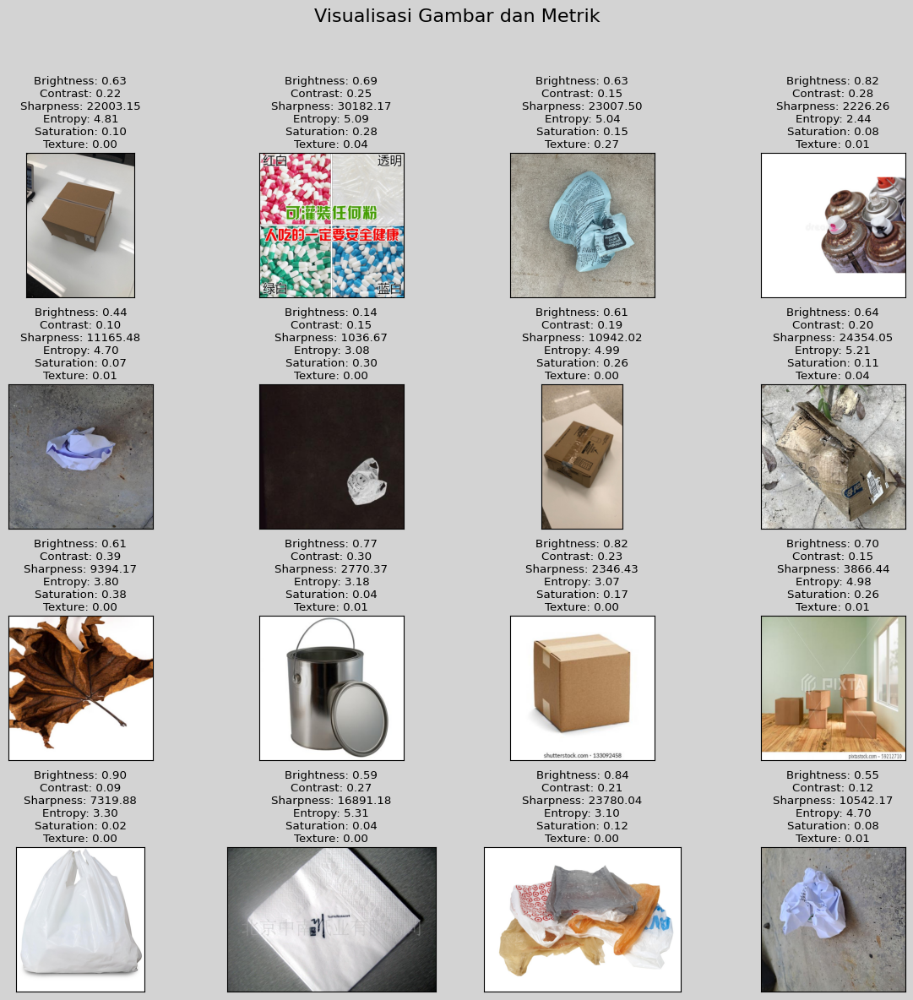

In [12]:
import matplotlib.pyplot as plt
from skimage import io

plt.rc('font', size=8)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 12), subplot_kw={'xticks': [], 'yticks': []})
plt.subplots_adjust(wspace=0.3, hspace=0.3)  # Atur jarak antara subplot
fig.suptitle('Visualisasi Gambar dan Metrik', fontsize=16) #judul
fig.patch.set_facecolor('lightgray')

for i, ax in enumerate(axes.flat):
    if i >= len(chosen_indices):
        ax.axis('off')  # Matikan sumbu jika tidak ada gambar
        continue

    index = chosen_indices[i]
    img = io.imread(test_df.Filepath[index])
    q_index = metrics_df.index[metrics_df['Path'] == test_df.Filepath[index]][0]
    ax.imshow(img)
    ax.set_title(f"Brightness: {metrics_df.iloc[q_index]['AvgBrightness']:.2f}\nContrast: {metrics_df.iloc[q_index]['Contrast']:.2f}\nSharpness: {metrics_df.iloc[q_index]['Sharpness']:.2f}\nEntropy: {metrics_df.iloc[q_index]['Entropy']:.2f}\nSaturation: {metrics_df.iloc[q_index]['Saturation']:.2f}\nTexture: {metrics_df.iloc[q_index]['Texture']:.2f}", wrap=True)

plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()

 Penjelasan singkat:
 
 Kode ini digunakan untuk menampilkan sampel gambar dari dataset dalam grid, bersama dengan metrik kualitas gambar seperti kecerahan, kontras, ketajaman, entropi, saturasi, dan tekstur. Tujuannya adalah untuk memvisualisasikan gambar sekaligus melihat metrik kualitasnya secara langsung

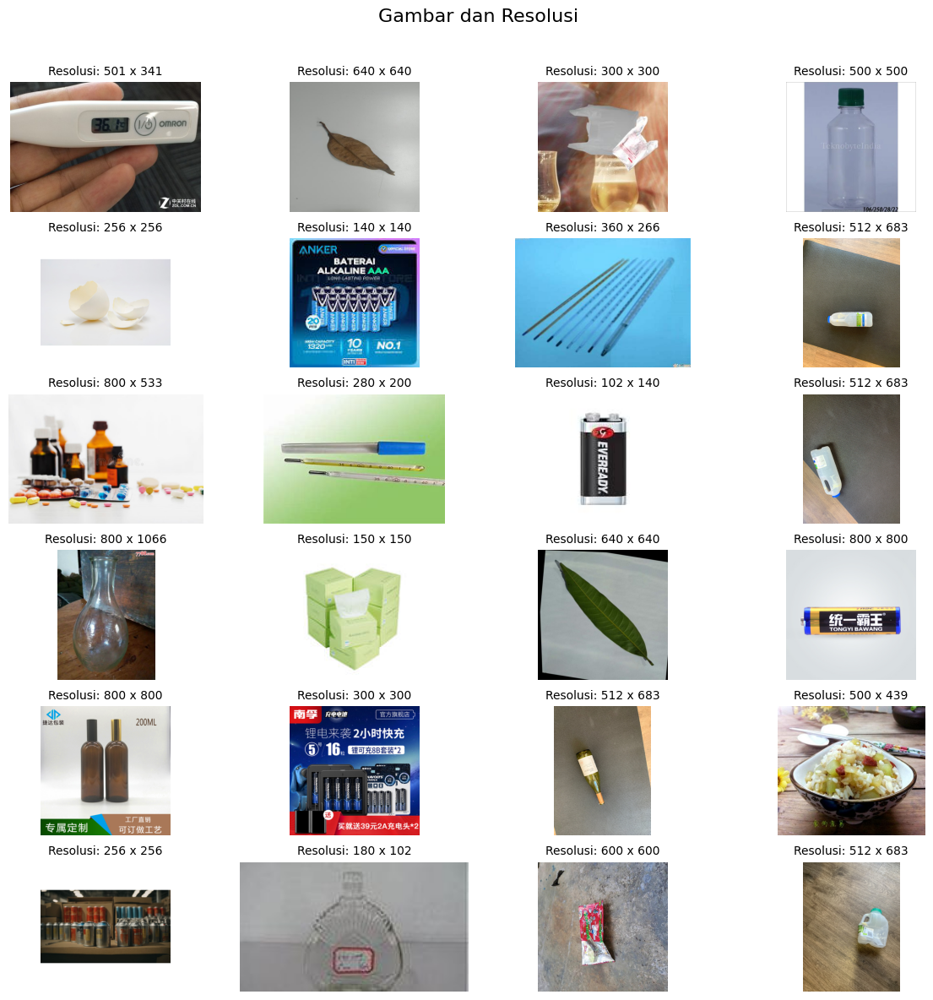

In [13]:
import math

def show_images_resolutions(test_df, num_images=24):
    selected_images = test_df.sample(num_images) #gambar dipilih acak
 
    num_cols = 4
    num_rows = math.ceil(num_images / num_cols)

    # tata letak
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 12))
    fig.suptitle('Gambar dan Resolusi', fontsize=16)

    # Iterasi gambar, tampilkan
    for i, (index, row) in enumerate(selected_images.iterrows()):
        ax = axes.flatten()[i]
        image_path = row['Filepath']
        with Image.open(image_path) as img:
            ax.imshow(img)
            ax.set_title(f"Resolusi: {img.width} x {img.height}", fontsize=10)
            ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

show_images_resolutions(test_df, num_images=24)

Penjelasan singkat:

Kode ini digunakan untuk menampilkan sampel gambar dari dataset beserta resolusi masing-masing gambar. Tujuannya adalah untuk memvisualisasikan gambar dan mengetahui resolusinya secara langsung, sehingga membantu dalam evaluasi dan analisis kualitas teknis gambar dalam dataset

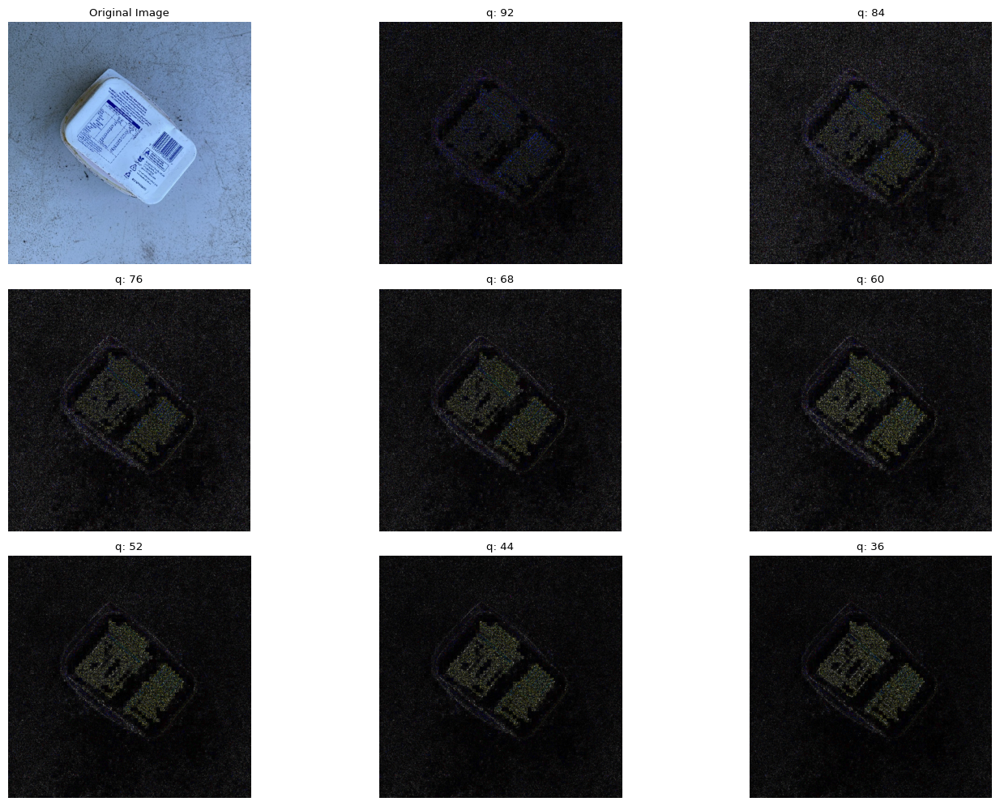

In [14]:
import os
import random
from PIL import Image, ImageChops, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

def get_random_image(dir_path):
    return os.path.join(dir_path, random.choice([f for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f))]))

def compute_ela(img_path, quality=90):
    temp_file = 'temp_img1.jpeg'
    img = Image.open(img_path)
    img.save(temp_file, 'JPEG', quality=quality)
    comp_img = Image.open(temp_file)
    ela_diff = ImageChops.difference(img, comp_img).convert('L')
    os.remove(temp_file)  # Menghapus file sementara
    return np.array(ela_diff) * 15

def create_ela_image(img_path, quality=90):
    temp_file = 'temp_img1.jpeg'
    img = Image.open(img_path).convert('RGB')
    img.save(temp_file, 'JPEG', quality=quality)
    comp_img = Image.open(temp_file)
    ela_img = ImageChops.difference(img, comp_img)
    os.remove(temp_file)  # Menghapus file sementara
    scale = 255.0 / (max(max(ex[1] for ex in ela_img.getextrema()), 1) + 1)  # Menambahkan 1 untuk menghindari pembagian dengan 0
    return ImageEnhance.Brightness(ela_img).enhance(scale)

# Visualisasi
dir_path = 'test'
img_path = get_random_image(dir_path)
orig_img = Image.open(img_path).convert('RGB')
qualities = [100 - i * 8 for i in range(9)]

fig, axes = plt.subplots(3, 3, figsize=(15, 10))
for ax, q in zip(axes.flat, qualities):
    if q == 100:
        ax.imshow(orig_img)
        ax.set_title('Original Image')
    else:
        ela_img = create_ela_image(img_path, q)
        ax.imshow(ela_img, cmap='gray')
        ax.set_title(f'q: {q}')
    ax.axis('off')
plt.tight_layout()
plt.show()

Penjelasan singkat:

Kode ini digunakan untuk menampilkan perbedaan tingkat kompresi gambar menggunakan metode Error Level Analysis (ELA). Tujuannya adalah untuk mendeteksi perubahan atau manipulasi pada gambar dengan membandingkan gambar asli dengan gambar yang disimpan kembali pada berbagai tingkat kualitas kompresi JPEG. ELA membantu dalam analisis forensik gambar untuk melihat artefak kompresi yang bisa mengindikasikan adanya manipulasi pada gambar

In [15]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split, GridSearchCV
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import Adam
import pandas as pd
import pathlib

# Konstanta
TARGET_SIZE = (224, 224)
BATCH_SIZE = 32

#dataset
train_dir = pathlib.Path('train')
test_dir = pathlib.Path('test')
val_dir = pathlib.Path('validation')

# Muat jalur file gambar dan label
def load_image_paths_and_labels(directory):
    image_extensions = [".jpg", ".JPG", ".jpeg", ".png"]
    image_paths = []
    for ext in image_extensions:
        image_paths.extend(list(directory.rglob(f"*{ext}")))
    image_paths = [str(fp).replace("\\", "/") for fp in image_paths]
    # Ekstrak label
    labels = [str(fp).split("/")[-2] for fp in image_paths]
    #DataFrame
    image_paths = pd.Series(image_paths, name="Filepath")
    labels = pd.Series(labels, name="Labels")
    df = pd.DataFrame({"Filepath": image_paths, "Labels": labels})
    
    return df

# Memuat data
train_df = load_image_paths_and_labels(train_dir)
test_df = load_image_paths_and_labels(test_dir)
val_df = load_image_paths_and_labels(val_dir)

# Memeriksa tipe data label
train_df['Labels'] = train_df['Labels'].astype(str)
test_df['Labels'] = test_df['Labels'].astype(str)
val_df['Labels'] = val_df['Labels'].astype(str)

# ImageDataGenerator untuk preprocessing
train_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.efficientnet.preprocess_input, validation_split=0.2)
test_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.efficientnet.preprocess_input)

# Mengonversi data ke iterator
train_proses = train_datagen.flow_from_dataframe(dataframe=train_df, x_col='Filepath', y_col='Labels', target_size=TARGET_SIZE, color_mode='rgb', class_mode='categorical', batch_size=BATCH_SIZE, shuffle=True, seed=42, subset='training')
val_proses = train_datagen.flow_from_dataframe(dataframe=train_df, x_col='Filepath', y_col='Labels', target_size=TARGET_SIZE, color_mode='rgb', class_mode='categorical', batch_size=BATCH_SIZE, shuffle=True, seed=42, subset='validation')
test_proses = test_datagen.flow_from_dataframe(dataframe=test_df, x_col='Filepath', y_col=None, target_size=TARGET_SIZE, batch_size=BATCH_SIZE, class_mode=None, shuffle=False)

Found 10623 validated image filenames belonging to 18 classes.
Found 2655 validated image filenames belonging to 18 classes.
Found 3327 validated image filenames.


Penjelasan singkat:

1. Membaca Gambar dan Label: Mengambil jalur file gambar dan label dari direktori dataset (train, test, dan validation) dan menyimpannya dalam DataFrame.

2. Preprocessing Gambar: Menggunakan ImageDataGenerator untuk melakukan preprocessing gambar, seperti normalisasi menggunakan fungsi preprocess_input dari EfficientNet.

3. Membuat Iterator Data: Mengonversi dataset menjadi iterator untuk digunakan dalam pelatihan model, termasuk pembagian dataset pelatihan menjadi subset pelatihan dan validasi.

Menghasilkan data pelatihan , validasi, dan data tes

c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\PIL\Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


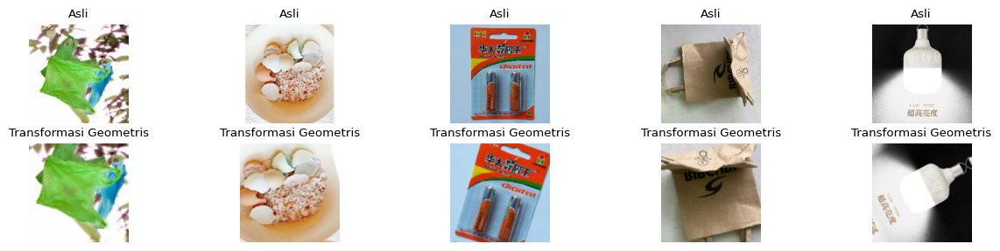

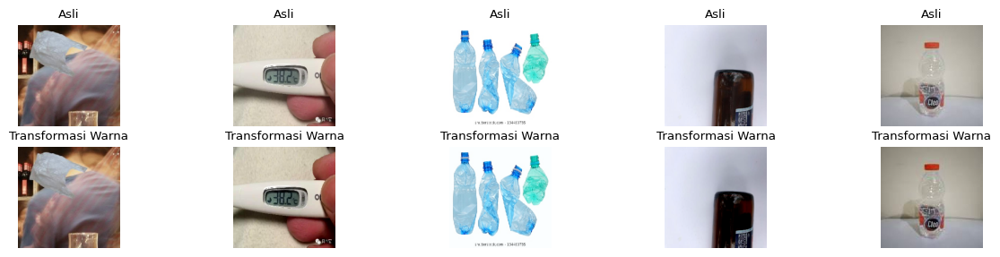

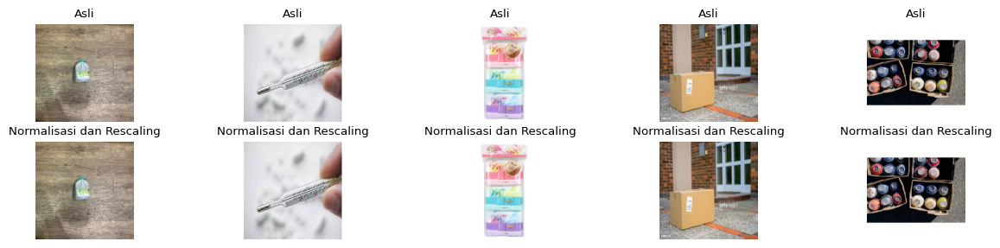

In [16]:
def plot_augmentation_examples(dataset, augmentation_layer, title, num_examples=5):
    plt.figure(figsize=(15, 5))
    for i in range(num_examples):
        images, _ = next(dataset)
        augmented_images = augmentation_layer(images, training=True)
        
        # Normalisasi gambar untuk tampilan
        def normalize_image(image):
            min_val = tf.reduce_min(image)
            max_val = tf.reduce_max(image)
            return (image - min_val) / (max_val - min_val)

        ax = plt.subplot(3, num_examples, i + 1)
        plt.imshow(normalize_image(images[0]).numpy())
        plt.title("Asli")
        plt.axis("off")

        ax = plt.subplot(3, num_examples, i + 1 + num_examples)
        plt.imshow(normalize_image(augmented_images[0]).numpy())
        plt.title(title)
        plt.axis("off")

    plt.show()

# Definisi lapisan augmentasi
geometric_augmentation = tf.keras.Sequential([
    tf.keras.layers.Resizing(224, 224),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
    tf.keras.layers.RandomWidth(0.2),
    tf.keras.layers.RandomHeight(0.2),
    tf.keras.layers.RandomCrop(200, 200)
])

color_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.2)
])

normalization_augmentation = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255)
])

# Plot hasil augmentasi untuk setiap grup
plot_augmentation_examples(train_proses, geometric_augmentation, "Transformasi Geometris")
plot_augmentation_examples(train_proses, color_augmentation, "Transformasi Warna")
plot_augmentation_examples(train_proses, normalization_augmentation, "Normalisasi dan Rescaling")


Penjelasan singkat:

Augmentasi digunakn untuk meningkatkan keragaman data dan menjadi legih tahan terhadap variasi gambarnya. 


1. Transformasi Geometris: Transformasi seperti flipping horizontal, rotasi acak, zoom, perubahan lebar dan tinggi, serta cropping membantu model belajar untuk mengenali objek meskipun posisinya berbeda.

2. Transformasi Warna: Penyesuaian kontras dan kecerahan membantu model untuk belajar mengenali objek di bawah kondisi pencahayaan yang berbeda.

3. Normalisasi dan Rescaling: Normalisasi membantu dalam menstandarkan intensitas piksel gambar, sementara rescaling mengubah rentang nilai piksel sehingga sesuai dengan format yang dibutuhkan oleh model.


### **Arsitektur**

In [ ]:
# CNN Transfer Learning (EfficientNet)
def create_effiacientnet_model(learning_rate=0.001, dense_units=128, dropout_rate=0.45):
    # Membuat model sekuensial
    model_efficientnet = Sequential()

    # Memuat model EfficientNetB0 pra-trained
    pretrained_model_efficientnet = tf.keras.applications.EfficientNetB0(
        input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3),
        include_top=False,
        weights='imagenet',
        pooling='max'
    )

    # Menambahkan model pra-trained ke model sekuensial
    model_efficientnet.add(pretrained_model_efficientnet)

    # Membekukan bobot model pra-trained
    pretrained_model_efficientnet.trainable = False

    # Menambahkan lapisan baru di atas model pra-trained
    model_efficientnet.add(Dense(dense_units, activation='relu'))
    model_efficientnet.add(Dropout(dropout_rate))
    model_efficientnet.add(Dense(dense_units, activation='relu'))
    model_efficientnet.add(Dropout(dropout_rate))
    model_efficientnet.add(Dense(18, activation='softmax'))

    # Mengkompilasi model dengan optimizer, fungsi loss, dan metrik
    model_efficientnet.compile(optimizer=Adam(learning_rate),
                               loss='categorical_crossentropy',
                               metrics=['accuracy'])
    return model_efficientnet

# CNN Scratch
def create_cnn_model(learning_rate=0.001, dense_units=128, dropout_rate=0.5):
    # Membuat model sekuensial dengan lapisan konvolusi, pooling, dan dense
    model_cnn = Sequential()
    model_cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3)))
    model_cnn.add(MaxPooling2D((2, 2)))
    model_cnn.add(Conv2D(64, (3, 3), activation='relu'))
    model_cnn.add(MaxPooling2D((2, 2)))
    model_cnn.add(Flatten())
    model_cnn.add(Dense(dense_units, activation='relu'))
    model_cnn.add(Dropout(dropout_rate))
    model_cnn.add(Dense(dense_units // 2, activation='relu'))
    model_cnn.add(Dropout(dropout_rate))
    model_cnn.add(Dense(18, activation='softmax'))

    # Mengkompilasi model dengan optimizer, fungsi loss, dan metrik
    optimizer = Adam(learning_rate=learning_rate)
    model_cnn.compile(optimizer=optimizer,
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    return model_cnn

# Mendefinisikan grid parameter untuk tuning hiperparameter
param_grid_efficientnet = {
    'learning_rate': [0.001, 0.0001],
    'dense_units': [128, 256],
    'dropout_rate': [0.5]
}

param_grid_cnn = {
    'learning_rate': [0.001, 0.0001],
    'dense_units': [128, 256],
    'dropout_rate': [0.5]
}

# Fungsi untuk melakukan tuning hiperparameter secara manual
def manual_grid_search(param_grid, model_func, train_proses, val_proses):
    best_model = None
    best_accuracy = 0
    best_params = None
    best_history = None
    
    # Melakukan iterasi melalui kombinasi parameter
    for lr in param_grid['learning_rate']:
        for units in param_grid['dense_units']:
            for dropout in param_grid['dropout_rate']:
                print(f"Training with learning_rate={lr}, dense_units={units}, dropout_rate={dropout}")
                model = model_func(learning_rate=lr, dense_units=units, dropout_rate=dropout)

                # Membuat callback untuk checkpoint, penghentian dini, dan penurunan learning rate
                checkpoint_callback = ModelCheckpoint(f"best_model_{model_func.__name__}.weights.h5",
                                                      save_weights_only=True,
                                                      monitor="val_accuracy",
                                                      save_best_only=True)
                
                early_stopping = EarlyStopping(monitor="val_loss",
                                               patience=5,
                                               restore_best_weights=True)
                
                reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
                
                # Melatih model dengan callback
                history = model.fit(train_proses,
                                    validation_data=val_proses,
                                    epochs=10,
                                    callbacks=[early_stopping, checkpoint_callback, reduce_lr])
                
                # Mengevaluasi model dan menyimpan model terbaik
                results = model.evaluate(val_proses, verbose=0)
                accuracy = results[1]
                if accuracy > best_accuracy:
                    best_accuracy = accuracy
                    best_model = model
                    best_params = {'learning_rate': lr, 'dense_units': units, 'dropout_rate': dropout}
                    best_history = history
    
    print(f"Best accuracy: {best_accuracy} with params: {best_params}")
    return best_model, best_params, best_history

# Melakukan pencarian grid secara manual untuk model EfficientNet dan CNN
best_model_efficientnet, best_params_efficientnet, history_efficientnet = manual_grid_search(param_grid_efficientnet, create_efficientnet_model, train_proses, val_proses)
best_model_cnn, best_params_cnn, history_cnn = manual_grid_search(param_grid_cnn, create_cnn_model, train_proses, val_proses)

# Memilih model terbaik berdasarkan akurasi validasi
if history_efficientnet.history['val_accuracy'][-1] > history_cnn.history['val_accuracy'][-1]:
    best_model = best_model_efficientnet
    best_params = best_params_efficientnet
    print("EfficientNet is the best model.")
else:
    best_model = best_model_cnn
    best_params = best_params_cnn
    print("Simple CNN is the best model.")

Training with learning_rate=0.001, dense_units=128, dropout_rate=0.5
Epoch 1/10


c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


332/332 ━━━━━━━━━━━━━━━━━━━━ 440s 1s/step - accuracy: 0.1819 - loss: 3.2156 - val_accuracy: 0.3977 - val_loss: 1.9169 - learning_rate: 0.0010
Epoch 2/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 396s 1s/step - accuracy: 0.4655 - loss: 1.7483 - val_accuracy: 0.6414 - val_loss: 1.2336 - learning_rate: 0.0010
Epoch 3/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 392s 1s/step - accuracy: 0.5529 - loss: 1.4511 - val_accuracy: 0.8271 - val_loss: 0.6898 - learning_rate: 0.0010
Epoch 4/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 369s 1s/step - accuracy: 0.6014 - loss: 1.2555 - val_accuracy: 0.8215 - val_loss: 0.7010 - learning_rate: 0.0010
Epoch 5/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 390s 1s/step - accuracy: 0.6497 - loss: 1.1236 - val_accuracy: 0.8343 - val_loss: 0.6275 - learning_rate: 0.0010
Epoch 6/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 399s 1s/step - accuracy: 0.6716 - loss: 1.0240 - val_accuracy: 0.8328 - val_loss: 0.6507 - learning_rate: 0.0010
Epoch 7/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 356s 1s/step - accuracy: 0.6849 - loss: 0.9827 - val_

c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 279s 833ms/step - accuracy: 0.0824 - loss: 143.8685 - val_accuracy: 0.0011 - val_loss: 3.1101 - learning_rate: 0.0010
Epoch 2/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 255s 766ms/step - accuracy: 0.1173 - loss: 2.7968 - val_accuracy: 0.0023 - val_loss: 3.1873 - learning_rate: 0.0010
Epoch 3/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 256s 766ms/step - accuracy: 0.1774 - loss: 2.6825 - val_accuracy: 0.0185 - val_loss: 3.1102 - learning_rate: 0.0010
Epoch 4/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 249s 748ms/step - accuracy: 0.2314 - loss: 2.5344 - val_accuracy: 0.0309 - val_loss: 3.0029 - learning_rate: 0.0010
Epoch 5/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 246s 740ms/step - accuracy: 0.2770 - loss: 2.4049 - val_accuracy: 0.0923 - val_loss: 2.7542 - learning_rate: 0.0010
Epoch 6/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 289s 870ms/step - accuracy: 0.3414 - loss: 2.2019 - val_accuracy: 0.1379 - val_loss: 2.5912 - learning_rate: 0.0010
Epoch 7/10
332/332 ━━━━━━━━━━━━━━━━━━━━ 342s 1s/step - accurac

**Penjelasan:**

1. **Performa Model EfficientNet**:
   - Parameter terbaik untuk model EfficientNet adalah:
     - Learning rate: 0.001
     - Dense units: 256
     - Dropout rate: 0.5
   - Akurasi validasi terbaik yang dicapai: 0.9503

2. **Performa Model CNN Sederhana**:
   - Parameter terbaik untuk model CNN sederhana adalah:
     - Learning rate: 0.001
     - Dense units: 128
     - Dropout rate: 0.5
   - Akurasi validasi terbaik yang dicapai: 0.4621

3. **Proses Pelatihan**:
   - Model EfficientNet menunjukkan peningkatan yang signifikan dalam akurasi validasi selama beberapa epoch.
   - Model CNN sederhana kesulitan mencapai akurasi tinggi dan performanya jauh lebih rendah dibandingkan dengan EfficientNet.

**Kesimpulan:**
- **EfficientNet adalah Model Terbaik**: Model EfficientNet dengan transfer learning mengungguli model CNN sederhana dengan margin yang besar, mencapai akurasi validasi sebesar 95.03% dibandingkan dengan akurasi terbaik CNN sederhana sebesar 46.21%.
- **Efektivitas EfficientNet**: Penggunaan bobot pra-latih dan arsitektur canggih pada model EfficientNet berkontribusi pada performanya yang superior.
- **Efektivitas Grid Search Manual**: Grid search berhasil mengidentifikasi hyperparameter optimal untuk kedua model, dengan parameter terbaik yang mengarah pada model EfficientNet yang sangat akurat.


In [247]:
# CNN Transfer Learning (EfficientNet)
def create_effiacientnet_model(learning_rate=0.001, dense_units=128, dropout_rate=0.45):
    # Membuat model sekuensial
    model_efficientnet = Sequential()

    # Memuat model EfficientNetB0 pra-trained
    pretrained_model_efficientnet = tf.keras.applications.EfficientNetB0(
        input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3),
        include_top=False,
        weights='imagenet',
        pooling='max'
    )

    # Menambahkan model pra-trained ke model sekuensial
    model_efficientnet.add(pretrained_model_efficientnet)

    # Membekukan bobot model pra-trained
    pretrained_model_efficientnet.trainable = False

    # Menambahkan lapisan baru di atas model pra-trained
    model_efficientnet.add(Dense(dense_units, activation='relu'))
    model_efficientnet.add(Dropout(dropout_rate))
    model_efficientnet.add(Dense(dense_units, activation='relu'))
    model_efficientnet.add(Dropout(dropout_rate))
    model_efficientnet.add(Dense(18, activation='softmax'))

    # Mengkompilasi model dengan optimizer, fungsi loss, dan metrik
    model_efficientnet.compile(optimizer=Adam(learning_rate),
                               loss='categorical_crossentropy',
                               metrics=['accuracy'])
    return model_efficientnet

# CNN Scratch
def create_cnn_model(learning_rate=0.001, dense_units=128, dropout_rate=0.5):
    # Membuat model sekuensial dengan lapisan konvolusi, pooling, dan dense
    model_cnn = Sequential()
    model_cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3)))
    model_cnn.add(MaxPooling2D((2, 2)))
    model_cnn.add(Conv2D(64, (3, 3), activation='relu'))
    model_cnn.add(MaxPooling2D((2, 2)))
    model_cnn.add(Flatten())
    model_cnn.add(Dense(dense_units, activation='relu'))
    model_cnn.add(Dropout(dropout_rate))
    model_cnn.add(Dense(dense_units // 2, activation='relu'))
    model_cnn.add(Dropout(dropout_rate))
    model_cnn.add(Dense(18, activation='softmax'))

    # Mengkompilasi model dengan optimizer, fungsi loss, dan metrik
    optimizer = Adam(learning_rate=learning_rate)
    model_cnn.compile(optimizer=optimizer,
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    return model_cnn

# Mendefinisikan grid parameter untuk tuning hiperparameter
param_grid_efficientnet = {
    'learning_rate': [0.001, 0.0001],
    'dense_units': [128, 256],
    'dropout_rate': [0.5]
}

param_grid_cnn = {
    'learning_rate': [0.001, 0.0001],
    'dense_units': [128, 256],
    'dropout_rate': [0.5]
}

# Fungsi untuk melakukan tuning hiperparameter secara manual
def manual_grid_search(param_grid, model_func, train_proses, val_proses):
    best_model = None
    best_accuracy = 0
    best_params = None
    best_history = None
    
    # Melakukan iterasi melalui kombinasi parameter
    for lr in param_grid['learning_rate']:
        for units in param_grid['dense_units']:
            for dropout in param_grid['dropout_rate']:
                print(f"Training with learning_rate={lr}, dense_units={units}, dropout_rate={dropout}")
                model = model_func(learning_rate=lr, dense_units=units, dropout_rate=dropout)

                # Membuat callback untuk checkpoint, penghentian dini, dan penurunan learning rate
                checkpoint_callback = ModelCheckpoint(f"best_model_{model_func.__name__}.weights.h5",
                                                      save_weights_only=True,
                                                      monitor="val_accuracy",
                                                      save_best_only=True)
                
                early_stopping = EarlyStopping(monitor="val_loss",
                                               patience=5,
                                               restore_best_weights=True)
                
                reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
                
                # Melatih model dengan callback
                history = model.fit(train_proses,
                                    validation_data=val_proses,
                                    epochs=2,
                                    callbacks=[early_stopping, checkpoint_callback, reduce_lr])
                
                # Mengevaluasi model dan menyimpan model terbaik
                results = model.evaluate(val_proses, verbose=0)
                accuracy = results[1]
                if accuracy > best_accuracy:
                    best_accuracy = accuracy
                    best_model = model
                    best_params = {'learning_rate': lr, 'dense_units': units, 'dropout_rate': dropout}
                    best_history = history
    
    print(f"Best accuracy: {best_accuracy} with params: {best_params}")
    return best_model, best_params, best_history

# Melakukan pencarian grid secara manual untuk model EfficientNet dan CNN
best_model_efficientnet, best_params_efficientnet, history_efficientnet = manual_grid_search(param_grid_efficientnet, create_efficientnet_model, train_proses, val_proses)
best_model_cnn, best_params_cnn, history_cnn = manual_grid_search(param_grid_cnn, create_cnn_model, train_proses, val_proses)

# Memilih model terbaik berdasarkan akurasi validasi
if history_efficientnet.history['val_accuracy'][-1] > history_cnn.history['val_accuracy'][-1]:
    best_model = best_model_efficientnet
    best_params = best_params_efficientnet
    print("EfficientNet is the best model.")
else:
    best_model = best_model_cnn
    best_params = best_params_cnn
    print("Simple CNN is the best model.")

Training with learning_rate=0.001, dense_units=128, dropout_rate=0.5
Epoch 1/2


c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


332/332 ━━━━━━━━━━━━━━━━━━━━ 410s 1s/step - accuracy: 0.1791 - loss: 3.1877 - val_accuracy: 0.2320 - val_loss: 2.3661 - learning_rate: 0.0010
Epoch 2/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 447s 1s/step - accuracy: 0.4037 - loss: 1.9452 - val_accuracy: 0.2603 - val_loss: 2.1911 - learning_rate: 0.0010
Training with learning_rate=0.001, dense_units=256, dropout_rate=0.5
Epoch 1/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 404s 1s/step - accuracy: 0.2955 - loss: 3.0888 - val_accuracy: 0.7492 - val_loss: 0.8796 - learning_rate: 0.0010
Epoch 2/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 398s 1s/step - accuracy: 0.7049 - loss: 1.0293 - val_accuracy: 0.8508 - val_loss: 0.4960 - learning_rate: 0.0010
Training with learning_rate=0.0001, dense_units=128, dropout_rate=0.5
Epoch 1/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 390s 1s/step - accuracy: 0.0771 - loss: 4.6544 - val_accuracy: 0.1525 - val_loss: 2.7081 - learning_rate: 1.0000e-04
Epoch 2/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 356s 1s/step - accuracy: 0.1650 - loss: 2.7095 - val_accuracy: 0.348

c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 352s 1s/step - accuracy: 0.0805 - loss: 149.2737 - val_accuracy: 0.0019 - val_loss: 3.1193 - learning_rate: 0.0010
Epoch 2/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 359s 1s/step - accuracy: 0.1091 - loss: 2.8103 - val_accuracy: 0.0038 - val_loss: 3.1934 - learning_rate: 0.0010
Training with learning_rate=0.001, dense_units=256, dropout_rate=0.5
Epoch 1/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 523s 2s/step - accuracy: 0.0779 - loss: 238.4940 - val_accuracy: 0.0090 - val_loss: 3.1504 - learning_rate: 0.0010
Epoch 2/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 565s 2s/step - accuracy: 0.1370 - loss: 2.7778 - val_accuracy: 0.0203 - val_loss: 3.0947 - learning_rate: 0.0010
Training with learning_rate=0.0001, dense_units=128, dropout_rate=0.5
Epoch 1/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 419s 1s/step - accuracy: 0.0711 - loss: 20.3312 - val_accuracy: 0.0000e+00 - val_loss: 2.9082 - learning_rate: 1.0000e-04
Epoch 2/2
332/332 ━━━━━━━━━━━━━━━━━━━━ 424s 1s/step - accuracy: 0.0699 - loss: 2.8902 - 

Penjelasan singkat:

Keuntungan EfficientNet :  Menggunakan model yang sudah dilatih pada dataset besar membantu mempercepat pelatihan dan seringkali meningkatkan kinerja, terutama jika dataset kita tidak terlalu besar.

Keuntungan scratch : Membangun model dari awal memberikan fleksibilitas penuh untuk menyesuaikan setiap aspek arsitektur. Dengan membangun dari awal, kita dapat lebih memahami bagaimana setiap lapisan berkontribusi terhadap kinerja model.

In [248]:
LABELS = list(train_proses.class_indices.keys())

predictions = best_model.predict(test_proses)
predicted_labels = np.argmax(predictions, axis=1)
predicted_labels = [LABELS[label] for label in predicted_labels]

# submit
test_filenames = test_proses.filenames
test_filenames = [os.path.basename(filename) for filename in test_filenames] 
submission_df = pd.DataFrame({'file_name': test_filenames, 'label': predicted_labels})

submission_df

104/104 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step


,file_name,label
0,test_1.jpg,tablet_kapsul
1,test_10.jpg,kaleng
2,test_100.jpg,botol_obat
3,test_1000.jpg,tablet_kapsul
4,test_1001.jpg,kantong_plastik
...,...,...
3322,test_941.png,cangkang_telur
3323,test_946.png,botol_aerosol
3324,test_951.png,kaleng
3325,test_988.png,cangkang_telur


In [1]:
submission_df = pd.DataFrame({'file_name': test_filenames, 'label': predicted_labels})

submission_df
submission_df.to_csv('submit1.csv', index=False)

NameError: name 'pd' is not defined

In [250]:

results = best_model.evaluate(val_proses, verbose=0)
print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.49599
Test Accuracy: 85.08%


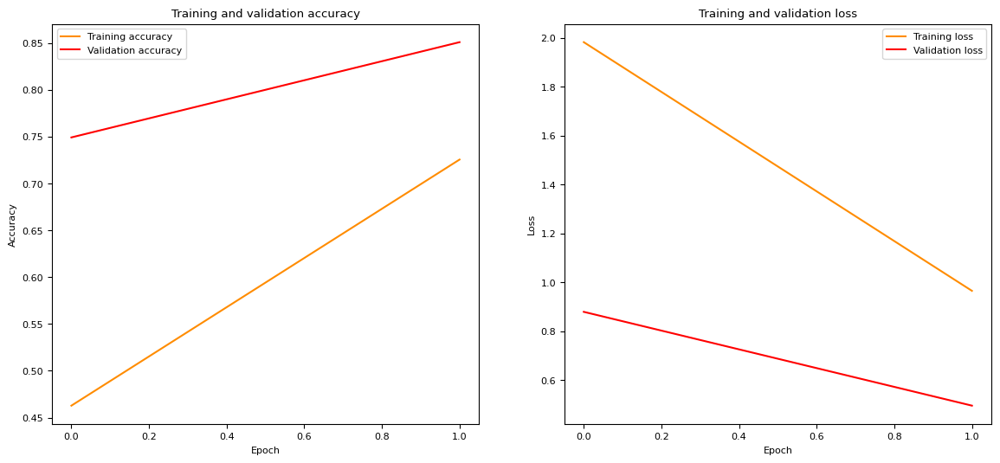

In [251]:
import matplotlib.pyplot as plt

# Data
accuracy = history_efficientnet.history['accuracy'] if best_model == best_model_efficientnet else history_cnn.history['accuracy']
val_accuracy = history_efficientnet.history['val_accuracy'] if best_model == best_model_efficientnet else history_cnn.history['val_accuracy']
loss = history_efficientnet.history['loss'] if best_model == best_model_efficientnet else history_cnn.history['loss']
val_loss = history_efficientnet.history['val_loss'] if best_model == best_model_efficientnet else history_cnn.history['val_loss']

epochs = range(len(accuracy))

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs, accuracy, color='darkorange', label='Training accuracy')
plt.plot(epochs, val_accuracy, color='red', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='best')

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, color='darkorange', label='Training loss')
plt.plot(epochs, val_loss, color='red', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')

plt.show()


**Penjelasan singkat:**

Grafik Kiri: Training and Validation Accuracy (Akurasi Pelatihan dan Validasi)

Akurasi pelatihan (garis oranye) dan akurasi validasi (garis merah) meningkat seiring dengan bertambahnya epoch.
Pada epoch awal, akurasi pelatihan lebih rendah dibandingkan akurasi validasi, tetapi kedua akurasi meningkat secara signifikan setelah beberapa epoch.
Hal ini menunjukkan bahwa model belajar dengan baik dari data pelatihan dan generalisasi dengan baik ke data validasi.

Grafik Kanan: Training and Validation Loss (Kehilangan Pelatihan dan Validasi)
Kehilangan pelatihan (garis oranye) dan kehilangan validasi (garis merah) menurun seiring dengan bertambahnya epoch.
Pada epoch awal, kehilangan pelatihan lebih tinggi dibandingkan kehilangan validasi, tetapi kedua kehilangan menurun secara signifikan setelah beberapa epoch.
Penurunan pada kehilangan pelatihan dan validasi menunjukkan bahwa model menjadi lebih akurat dalam memprediksi data seiring dengan pelatihan lebih lanjut.

### **Dari kedua arsitektur (transer learning dan scratch) Mana yang lebih baik? Mengapa?**

Model transfer learning (EfficientNet) memberikan hasil yang lebih baik dibandingkan dengan model yang dilatih dari awal (from scratch). Poin yang mendukung :

**1. Akurasi Validasi yang Lebih Tinggi:**

Model transfer learning dengan EfficientNet mencapai akurasi validasi terbaik sebesar 0.9217 pada epoch ke-10, sedangkan model yang dilatih dari awal mencapai akurasi validasi tertinggi hanya sekitar 0.4621 pada epoch ke-10.

**2. Konvergensi Lebih Cepat:**

Model transfer learning biasanya mencapai akurasi yang lebih tinggi lebih cepat dibandingkan dengan model yang dilatih dari awal. Hal ini terlihat dari akurasi yang tinggi sudah mulai tercapai pada epoch-epoch awal pada model transfer learning.

**3. Loss yang Lebih Rendah:**

Model transfer learning juga menunjukkan nilai loss yang lebih rendah dibandingkan dengan model yang dilatih dari awal. Nilai loss yang rendah mengindikasikan bahwa model lebih baik dalam meminimalkan kesalahan prediksi.